In [1]:
# check GPU 
# If you don't have GPU, please set it by Runtime -> Change runtime type
!nvidia-smi

Mon Jul 15 14:09:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 536.23                 Driver Version: 536.23       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti   WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   40C    P8              28W / 260W |   1406MiB / 11264MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os

print(os.getcwd())
os.chdir('2nd_try')
print(os.getcwd())

E:\success
E:\success\2nd_try


In [3]:
# install DiOr
import os
!git clone https://github.com/cuiaiyu/dressing-in-order
repo_name='dressing-in-order'
os.chdir(f'./{repo_name}')

fatal: destination path 'dressing-in-order' already exists and is not an empty directory.


In [4]:
!pip install tensorboardX

In [5]:
pip install gdown tqdm


Note: you may need to restart the kernel to use updated packages.


In [6]:
from tqdm.notebook import tqdm

In [7]:
# download data from https://github.com/yumingj/DeepFashion-MultiModal
import os
from tqdm.notebook import tqdm

if not os.path.exists("data/"):
  os.system("mkdir data")

def download_from_gdrive(dst_root, fn, gdrive_path, iszip=True):
  if not os.path.exists(dst_root):
    os.system("mkdir {}".format(dst_root))
  if not os.path.exists("{}/{}".format(dst_root, fn)):
    os.system("gdown {}".format(gdrive_path))
    if iszip:
      os.system("unzip {}.zip".format(fn))
      os.system("rm {}.zip".format(fn))
    os.system("mv {} {}/".format(fn, dst_root))
  print("download {}.".format(fn))

# download data
download_from_gdrive("data", "testM_lip", "1toeQwAe57LNPTy9EWGG0u1XfTI7qv6b1")
download_from_gdrive("data", "images", "1U2PljA7NE57jcSSzPs21ZurdIPXdYZtN")
download_from_gdrive("data","fasion-pairs-test.csv","12fZKGf0kIu5OX3mjC-C3tptxrD8sxm7x",iszip=False)
download_from_gdrive("data","fasion-annotation-test.csv","1MxkVFFtNsWFshQp_TA7qwIGEUEUIpYdS",iszip=False)
download_from_gdrive("data","standard_test_anns.txt","19nJSHrQuoJZ-6cSl3WEYlhQv6ZsAYG-X",iszip=False)

import os
from tqdm.notebook import tqdm
import shutil

# Create the test directory if it does not exist
if not os.path.exists(r"data/test"):
    os.mkdir(r"data/test")

# Collect target filenames from the 'data/testM_lip' directory
target_fns = [fn[:-4] for fn in os.listdir(r"data/testM_lip")]

# Print target filenames for debugging
# print(f"Target filenames: {target_fns}")

# Iterate over files in the 'data/images' directory and process them
for fn in tqdm(os.listdir(r"data/images")):
    elements = fn.split("-")
    elements[2] = elements[2].replace("_", "")
    last_elements = elements[-1].split("_")
    elements[-1] = last_elements[0] + "_" + last_elements[1] + last_elements[2]
    new_fn = "fashion" + "".join(elements)
    
    # Print the original and new filenames for debugging
    # print(f"Original filename: {fn}")
    # print(f"New filename: {new_fn}")

    if new_fn[:-4] in target_fns:
        src = os.path.join(r"data\images", fn)
        dst = os.path.join(r"data\test", new_fn)
        
        # Print the source and destination paths for debugging
        print(f"Moving {src} to {dst}")
        
        shutil.move(src, dst)




download testM_lip.
download images.
download fasion-pairs-test.csv.
download fasion-annotation-test.csv.
download standard_test_anns.txt.


  0%|          | 0/40658 [00:00<?, ?it/s]

In [8]:
import os
os.getcwd()

'E:\\success\\2nd_try\\dressing-in-order'

In [9]:
import torch

In [10]:
!pip install opencv-python

In [11]:
!pip install imageio

In [12]:
!pip install scipy

In [13]:
!pip install matplotlib

In [14]:
from models.dior_model import DIORModel
import os, json
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [15]:
os.getcwd()

'E:\\success\\2nd_try\\dressing-in-order'

In [16]:
!pip install scikit-image


In [17]:
import os
from tqdm.notebook import tqdm
import torch
from models.dior_model import DIORModel
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline


def download_from_gdrive(dst_root, fn, gdrive_path, iszip=True):
    if not os.path.exists(dst_root):
        os.system("mkdir {}".format(dst_root))
    if not os.path.exists("{}/{}".format(dst_root, fn)):
        os.system("gdown {}".format(gdrive_path))
        if iszip:
            os.system("unzip {}.zip".format(fn))
            os.system("rm {}.zip".format(fn))
        os.system("mv {} {}/".format(fn, dst_root))
    print("download {}.".format(fn))

dataroot = 'data'
exp_name = 'DIORv1_64' # DIOR_64
epoch = 'latest'
netG = 'diorv1' # dior
ngf = 64

## this is a dummy "argparse" 
class Opt:
    def __init__(self):
        pass
if True:
    opt = Opt()
    opt.dataroot = dataroot
    opt.isTrain = False
    opt.phase = 'test'
    opt.n_human_parts = 8; opt.n_kpts = 18; opt.style_nc = 64
    opt.n_style_blocks = 4; opt.netG = netG; opt.netE = 'adgan'
    opt.ngf = ngf
    opt.norm_type = 'instance'; opt.relu_type = 'leakyrelu'
    opt.init_type = 'orthogonal'; opt.init_gain = 0.02; opt.gpu_ids = [0]
    opt.frozen_flownet = True; opt.random_rate = 1; opt.perturb = False; opt.warmup=False
    opt.name = exp_name
    opt.vgg_path = ''; opt.flownet_path = ''
    opt.checkpoints_dir = 'checkpoints'
    opt.frozen_enc = True
    opt.load_iter = 0
    opt.epoch = epoch
    opt.verbose = False

# create model
#os.mkdir("checkpoints")
download_from_gdrive("checkpoints", "DIORv1_64", "1MyHq-P0c8zz7ey7p_HTTZKeMie5ZuNlb")

model = DIORModel(opt)
model.setup(opt)


download DIORv1_64.


E:\anaconda\envs\vton\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\anaconda\envs\vton\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


load vgg ckpt from torchvision dict.
[init] init pre-trained model vgg.
initialize network with orthogonal
initialize network with orthogonal
initialize network with kaiming
initialize network with orthogonal
[init] frozen net netVGG.
[init] frozen net netFlow.
[init] frozen net netE_attr.
[init] frozen net netE_attr.
loading the model from checkpoints\DIORv1_64\latest_net_E_attr.pth
loading the model from checkpoints\DIORv1_64\latest_net_G.pth
not exsits checkpoints\DIORv1_64\latest_net_VGG.pth
loading the model from checkpoints\DIORv1_64\latest_net_Flow.pth
---------- Networks initialized -------------
[Network E_attr] Total number of parameters : 1.191 M
[Network G] Total number of parameters : 16.501 M
[Network VGG] Total number of parameters : 0.113 M
[Network Flow] Total number of parameters : 6.608 M
-----------------------------------------------
[tensorboard] init tensorboard @ checkpoints\DIORv1_64\test


-1

In [18]:
# load data
from datasets.deepfashion_datasets import DFVisualDataset
Dataset = DFVisualDataset
ds = Dataset(dataroot=dataroot, dim=(256,176), n_human_part=8)

# preload a set of pre-selected models defined in "standard_test_anns.txt" for quick visualizations 
inputs = dict()
for attr in ds.attr_keys:
    inputs[attr] = ds.get_attr_visual_input(attr)
    
# define some tool functions for I/O
def load_img(pid, ds):
    if len(pid[0]) < 10: # load pre-selected models
        person = inputs[pid[0]]
        person = (i.cuda() for i in person)
        pimg, parse, to_pose = person
        pimg, parse, to_pose = pimg[pid[1]], parse[pid[1]], to_pose[pid[1]]
    else: # load model from scratch
        person = ds.get_inputs_by_key(pid[0])
        person = (i.cuda() for i in person)
        pimg, parse, to_pose = person
    return pimg.squeeze(), parse.squeeze(), to_pose.squeeze()

def plot_img(pimg=[], gimgs=[], oimgs=[], gen_img=[], pose=None):
    if pose != None:
        import utils.pose_utils as pose_utils
        print(pose.size())
        kpt = pose_utils.draw_pose_from_map(pose.cpu().numpy().transpose(1,2,0),radius=6)
        kpt = kpt[0]
    if not isinstance(pimg, list):
        pimg = [pimg]
    if not isinstance(gen_img, list):
        gen_img = [gen_img]
    out = pimg + gimgs + oimgs + gen_img
    if out:
        out = torch.cat(out, 2).float().cpu().detach().numpy()
        out = (out + 1) / 2 # denormalize
        out = np.transpose(out, [1,2,0])

        if pose != None:
            out = np.concatenate((kpt, out),1)
    else:
        out = kpt
    fig = plt.figure(figsize=(6,4), dpi= 100, facecolor='w', edgecolor='k')
    plt.axis('off')
    plt.imshow(out)

# define dressing-in-order function (the pipeline)
def dress_in_order(model, pid, pose_id=None, gids=[], ogids=[], order=[5,1,3,2], perturb=False):
    PID = [0,4,6,7]
    GID = [2,5,1,3]
    # encode person
    pimg, parse, from_pose = load_img(pid, ds)
    if perturb:
        pimg = perturb_images(pimg[None])[0]
    if not pose_id:
        to_pose = from_pose
    else:
        to_img, _, to_pose = load_img(pose_id, ds)
    psegs = model.encode_attr(pimg[None], parse[None], from_pose[None], to_pose[None], PID)

    # encode base garments
    gsegs = model.encode_attr(pimg[None], parse[None], from_pose[None], to_pose[None])
   
    
    # swap base garment if any
    gimgs = []
    for gid in gids:
        _,_,k = gid
        gimg, gparse, pose =  load_img(gid, ds)
        seg = model.encode_single_attr(gimg[None], gparse[None], pose[None], to_pose[None], i=gid[2])
        gsegs[gid[2]] = seg
        gimgs += [gimg * (gparse == gid[2])]

    # encode garment (overlay)
    garments = []
    over_gsegs = []
    oimgs = []
    for gid in ogids:
        oimg, oparse, pose = load_img(gid, ds)
        oimgs += [oimg * (oparse == gid[2])]
        seg = model.encode_single_attr(oimg[None], oparse[None], pose[None], to_pose[None], i=gid[2])
        over_gsegs += [seg]
    
    gsegs = [gsegs[i] for i in order] + over_gsegs
    gen_img = model.netG(to_pose[None], psegs, gsegs)
    
    return pimg, gimgs, oimgs, gen_img[0], to_pose
     


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


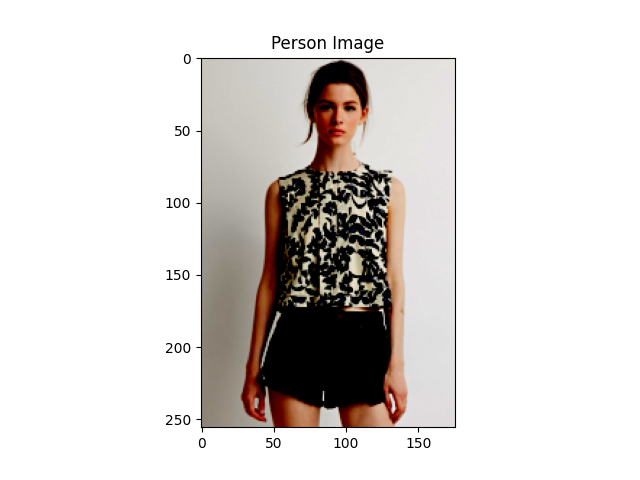

Displaying Garment Image 0:


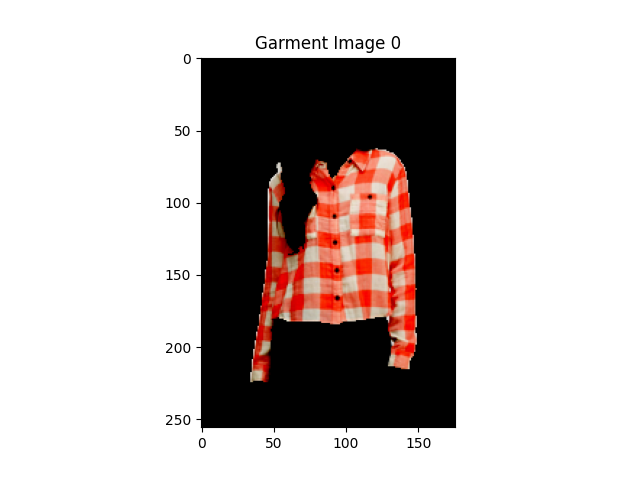

Displaying Garment Image 1:


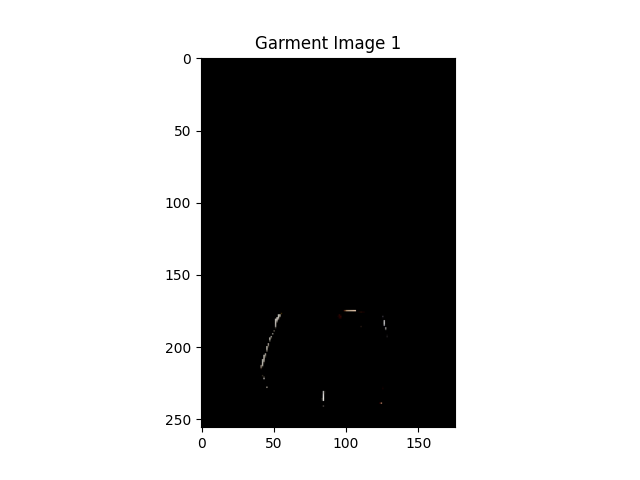

Displaying Generated Image:


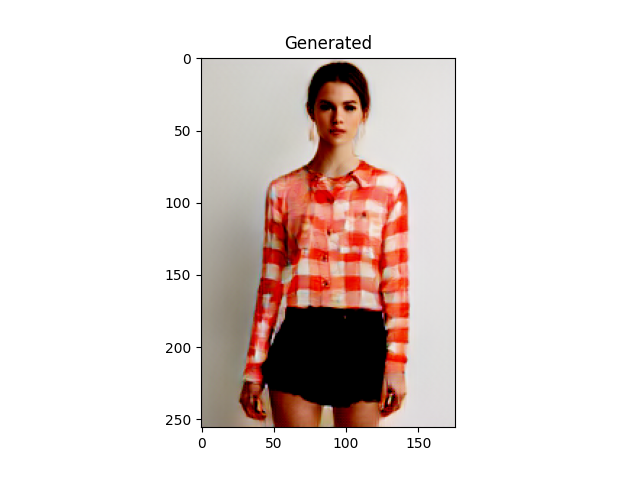

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


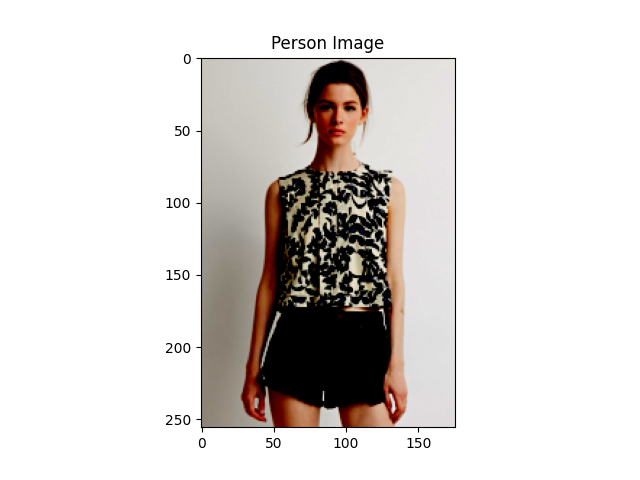

Displaying Garment Image 0:


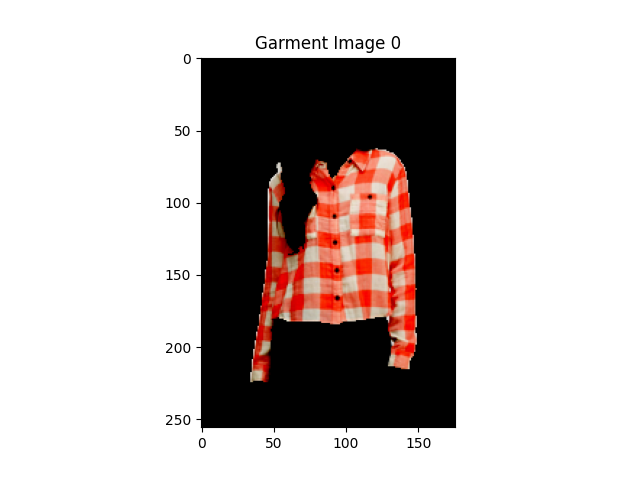

Displaying Garment Image 1:


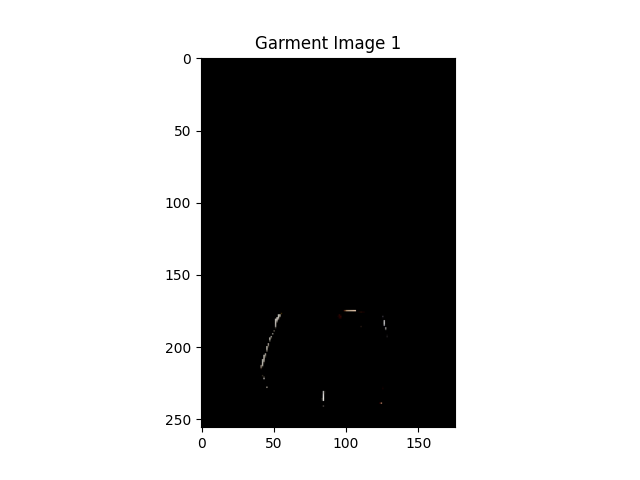

Displaying Generated Image:


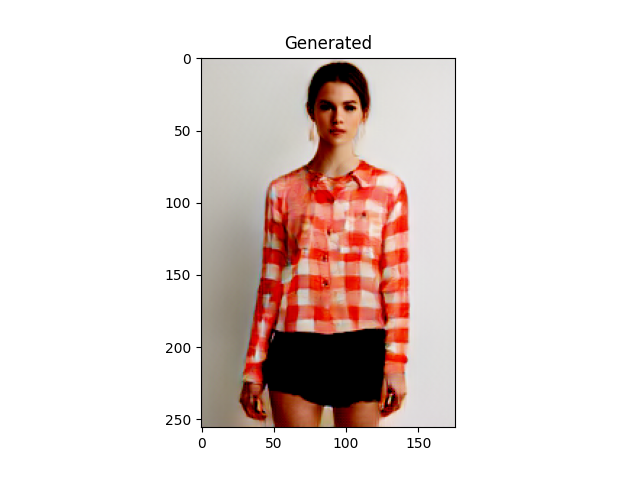

In [93]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",3, None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",3 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 3, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


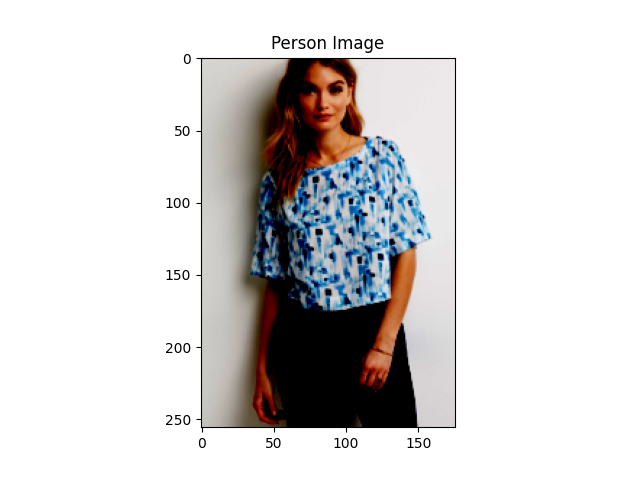

Displaying Garment Image 0:


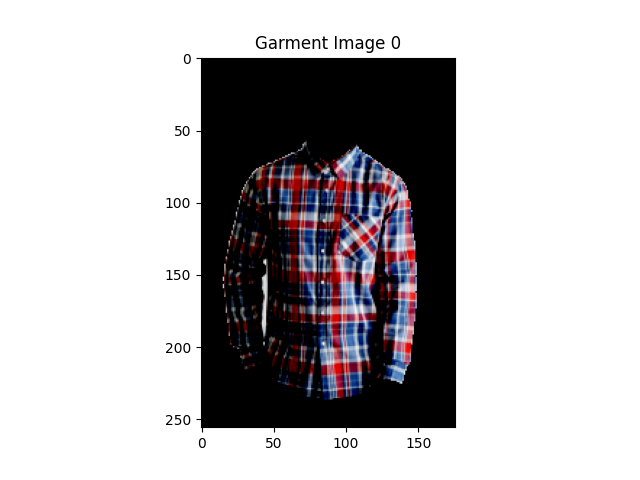

Displaying Garment Image 1:


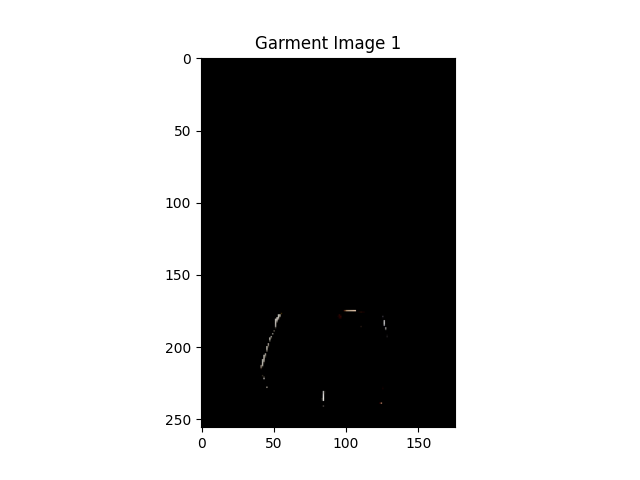

Displaying Generated Image:


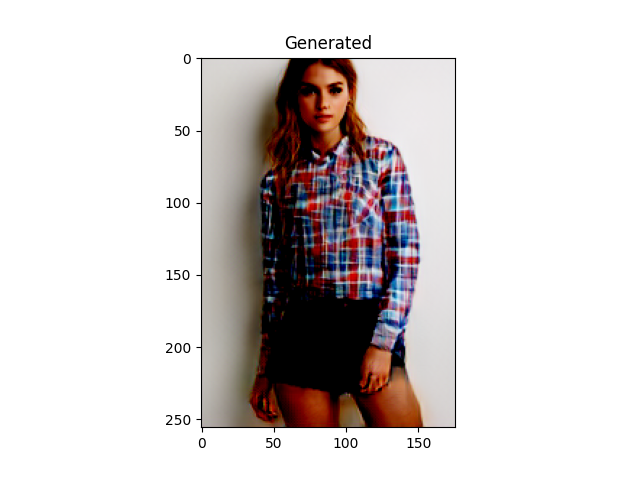

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


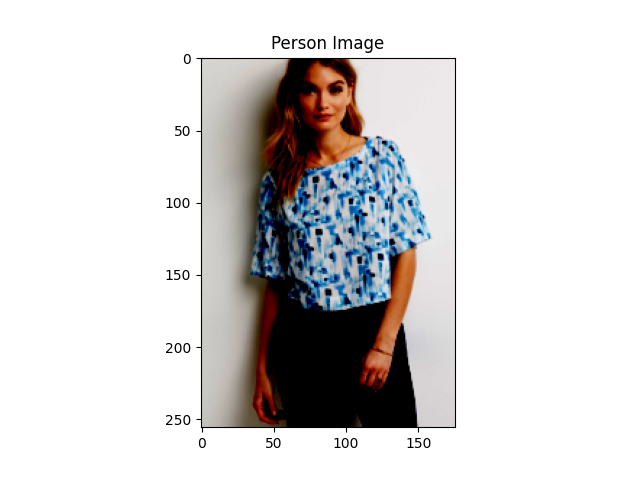

Displaying Garment Image 0:


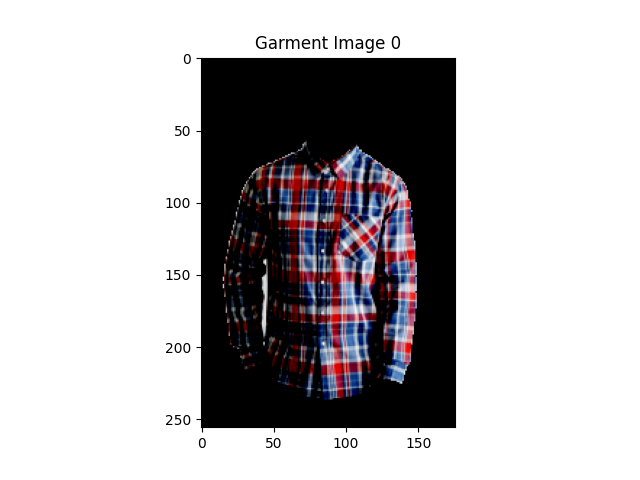

Displaying Garment Image 1:


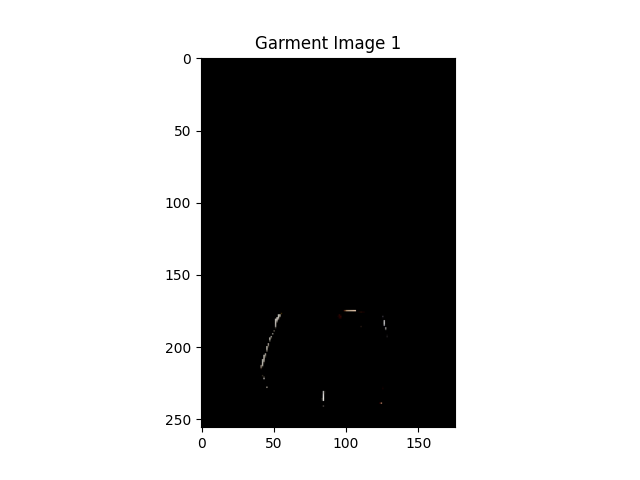

Displaying Generated Image:


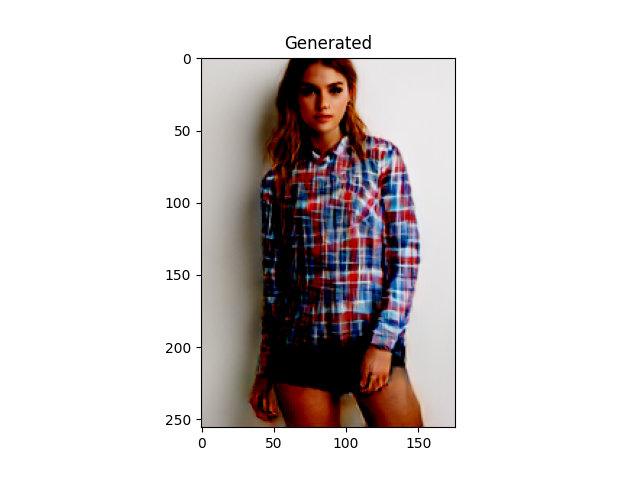

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",1 , None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",0 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 3, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


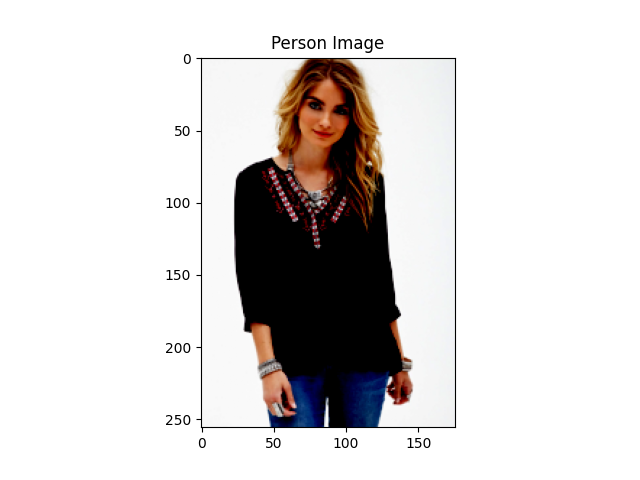

Displaying Garment Image 0:


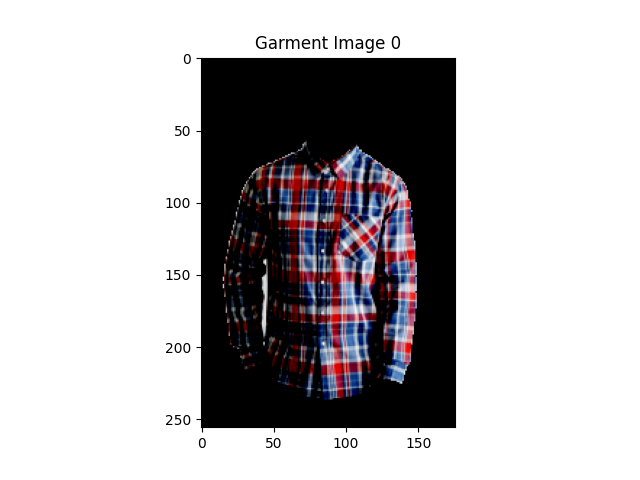

Displaying Garment Image 1:


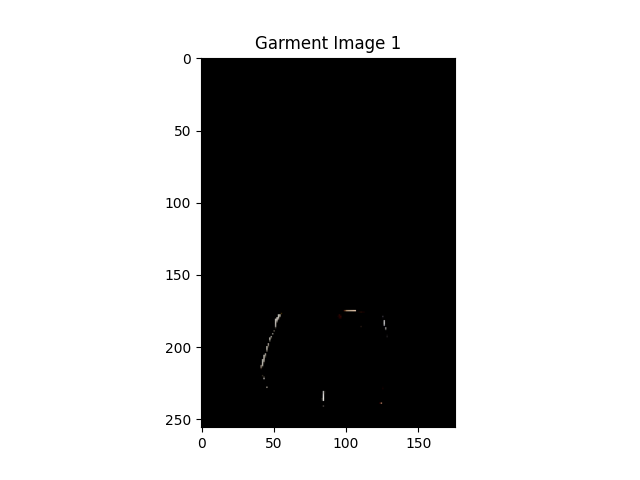

Displaying Generated Image:


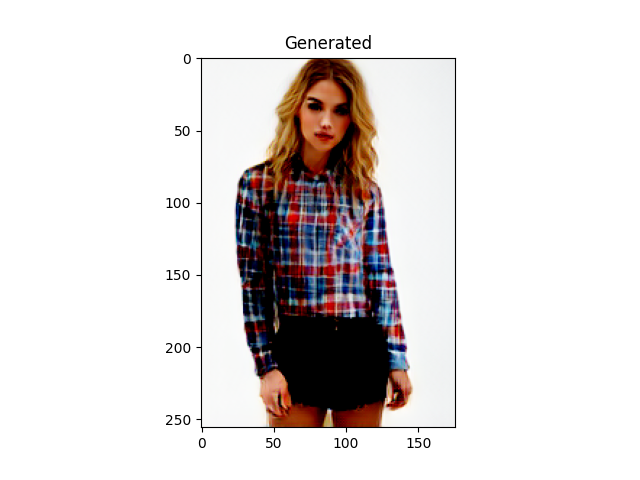

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


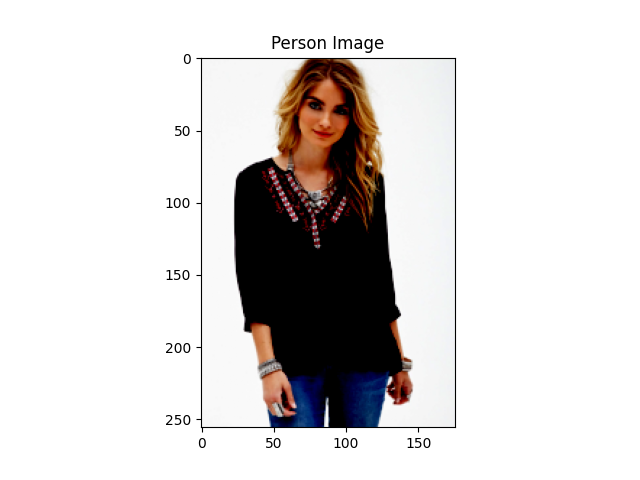

Displaying Garment Image 0:


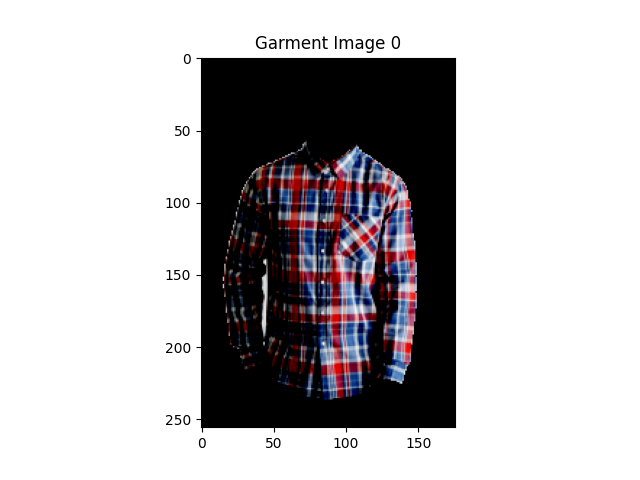

Displaying Garment Image 1:


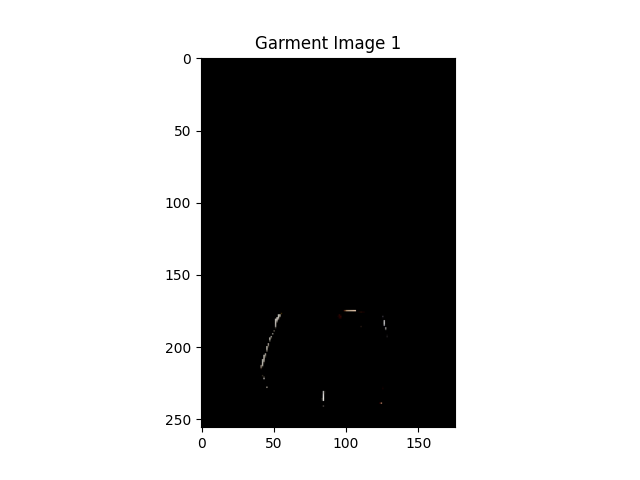

Displaying Generated Image:


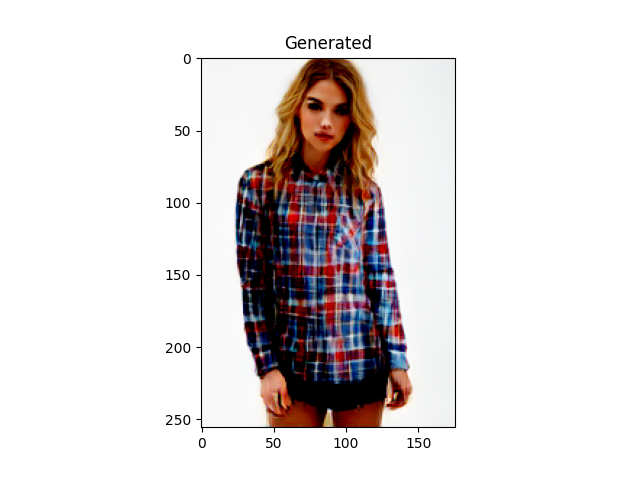

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",2 , None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",0 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 3, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


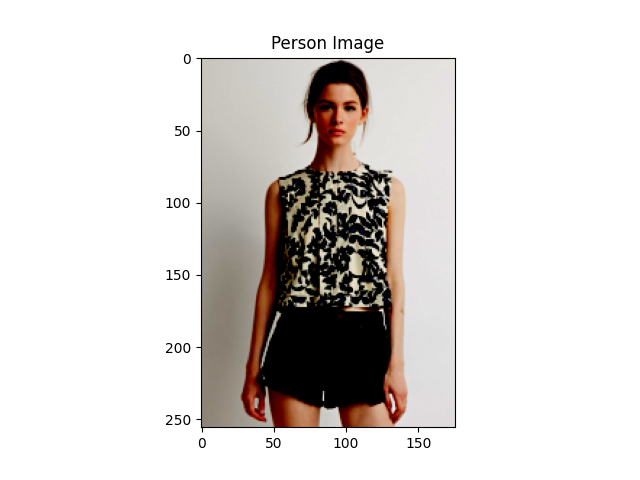

Displaying Garment Image 0:


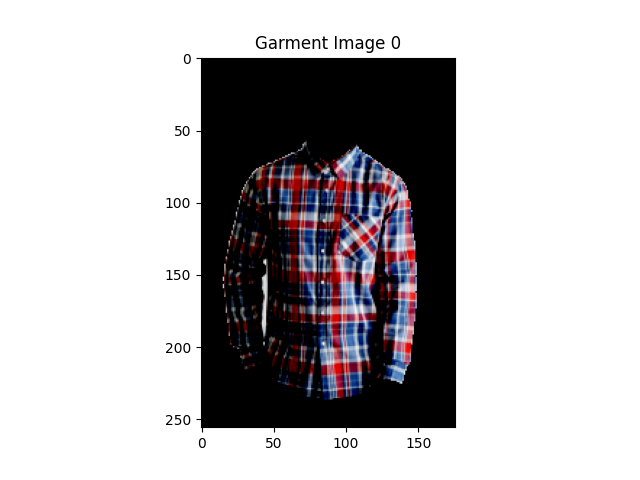

Displaying Garment Image 1:


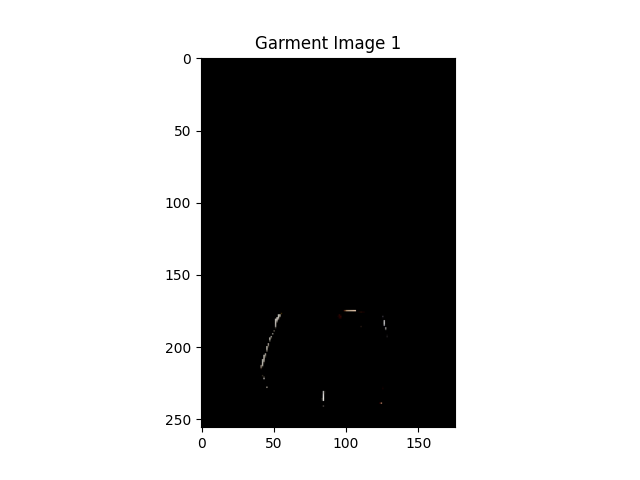

Displaying Generated Image:


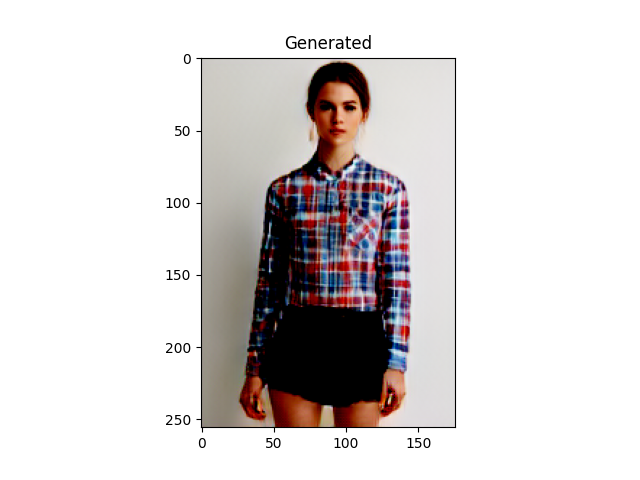

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


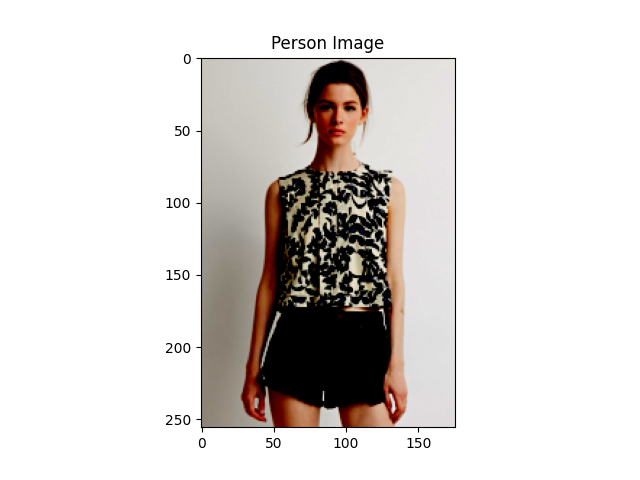

Displaying Garment Image 0:


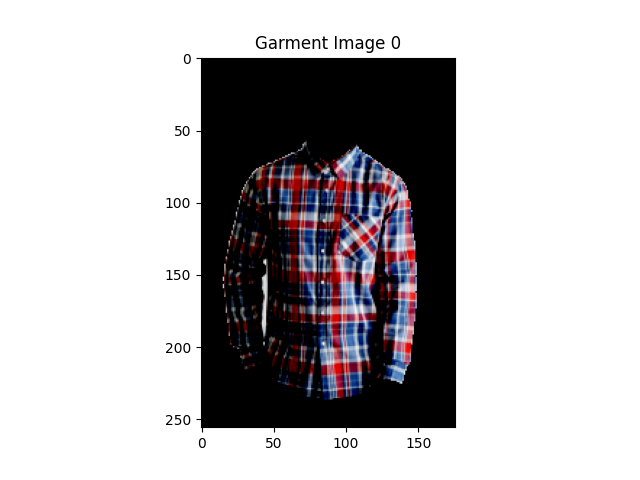

Displaying Garment Image 1:


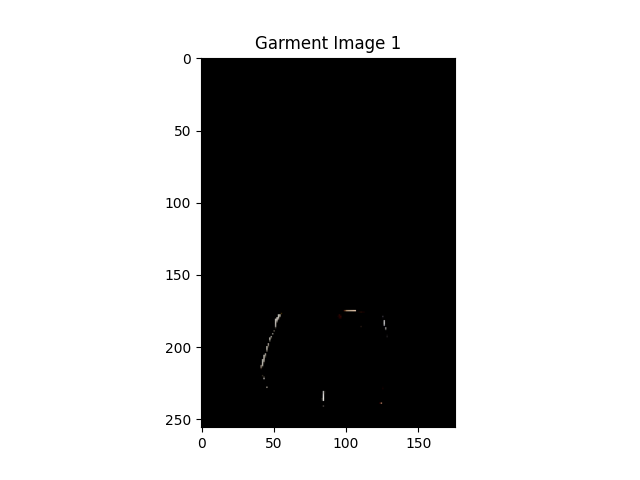

Displaying Generated Image:


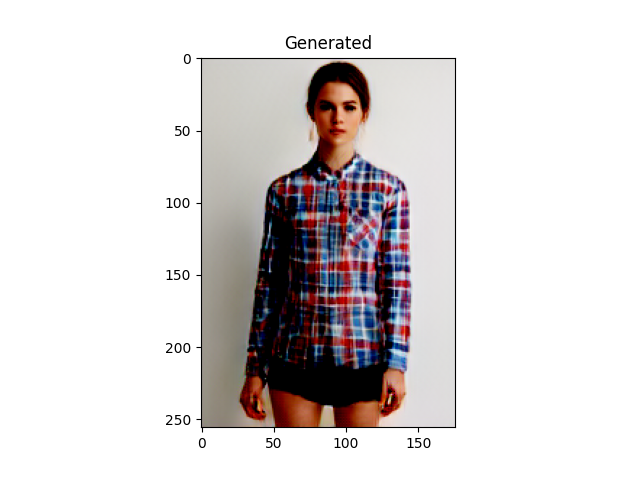

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",3 , None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",0 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 3, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


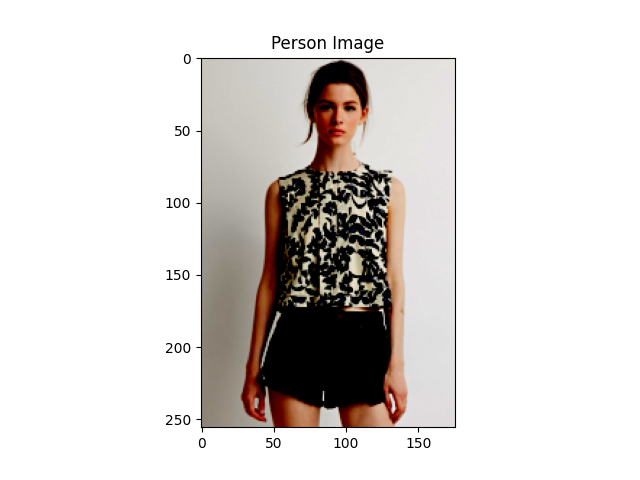

Displaying Garment Image 0:


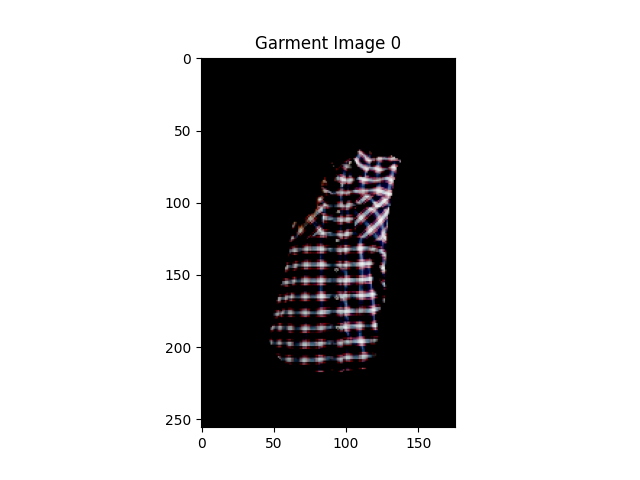

Displaying Garment Image 1:


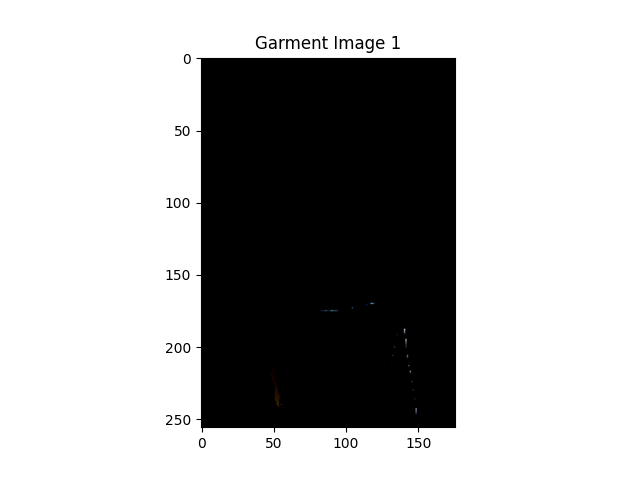

Displaying Generated Image:


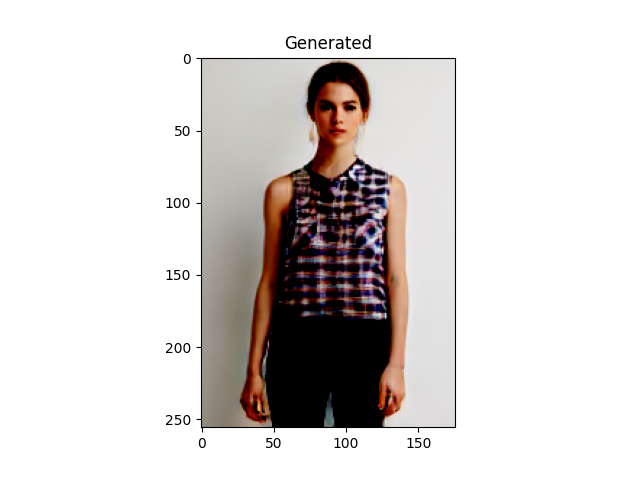

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


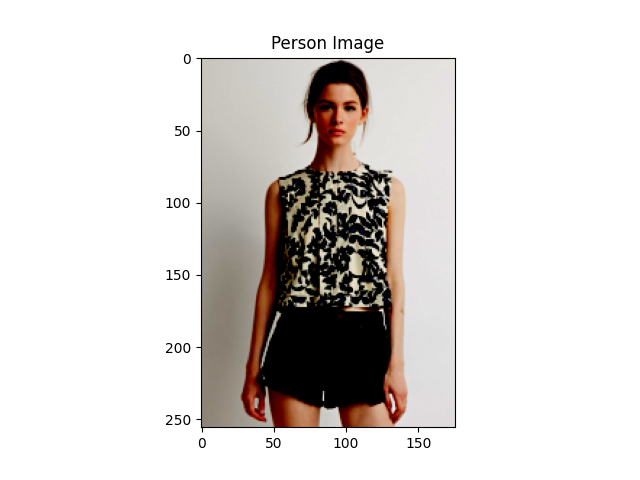

Displaying Garment Image 0:


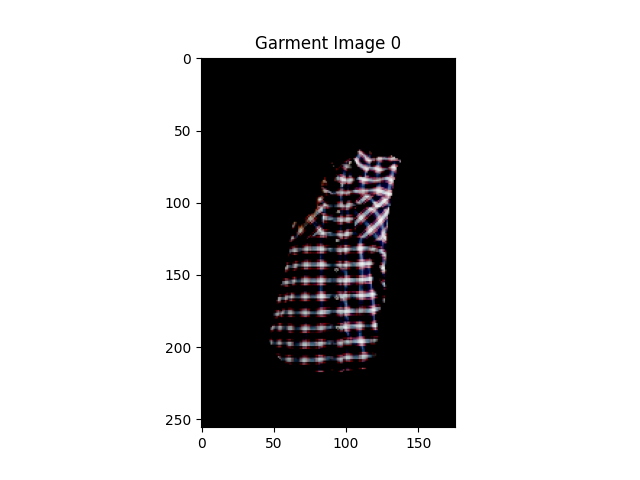

Displaying Garment Image 1:


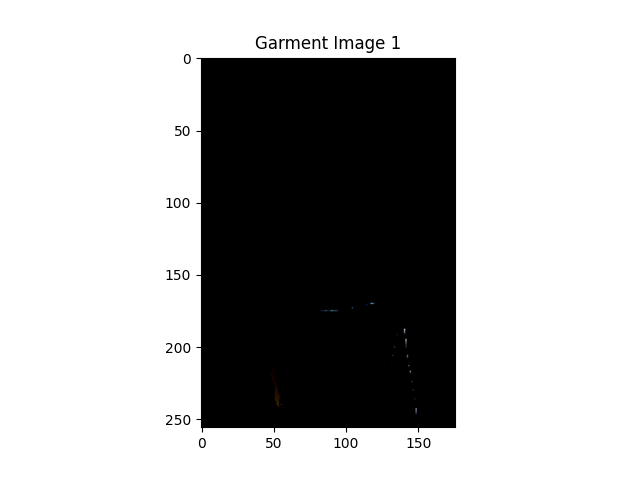

Displaying Generated Image:


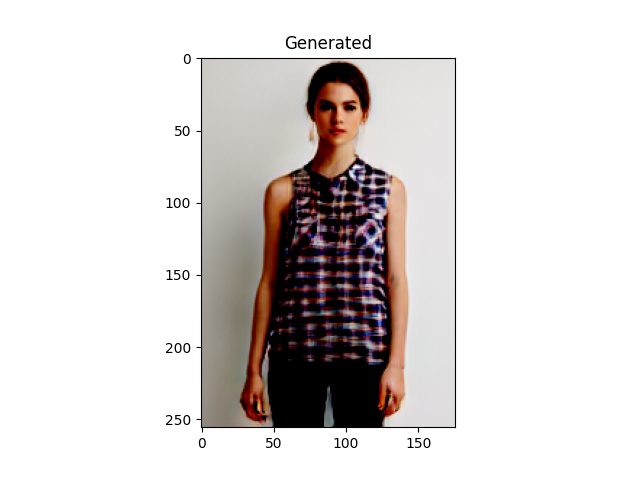

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",3 , None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",1 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 1, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


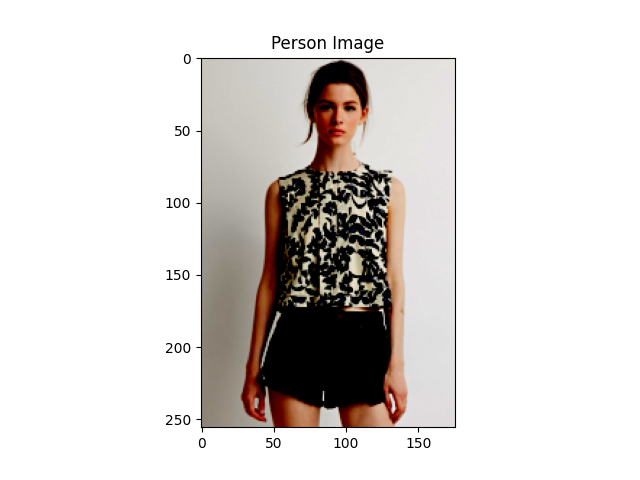

Displaying Garment Image 0:


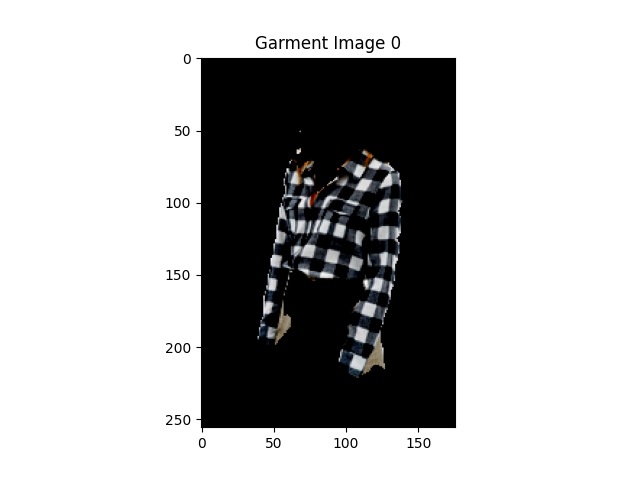

Displaying Garment Image 1:


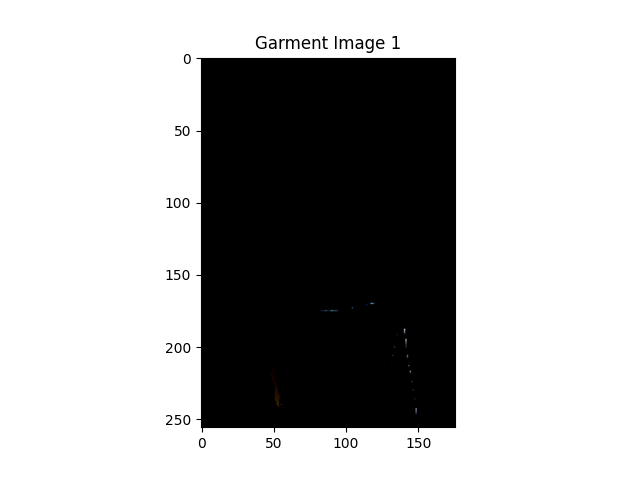

Displaying Generated Image:


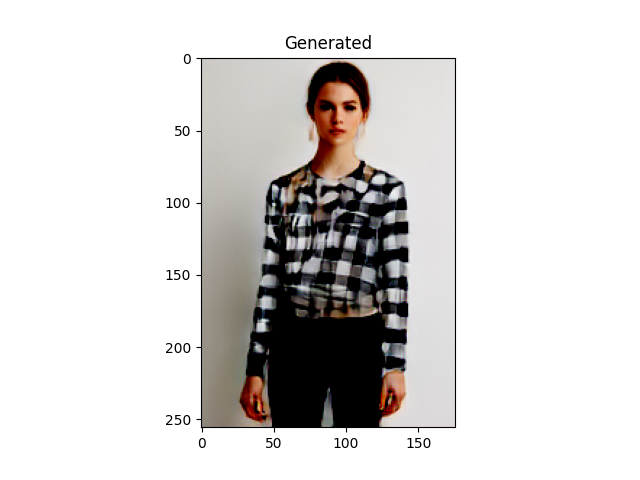

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


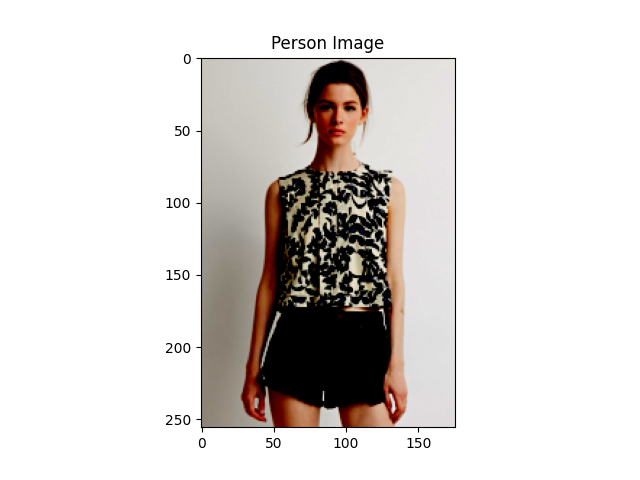

Displaying Garment Image 0:


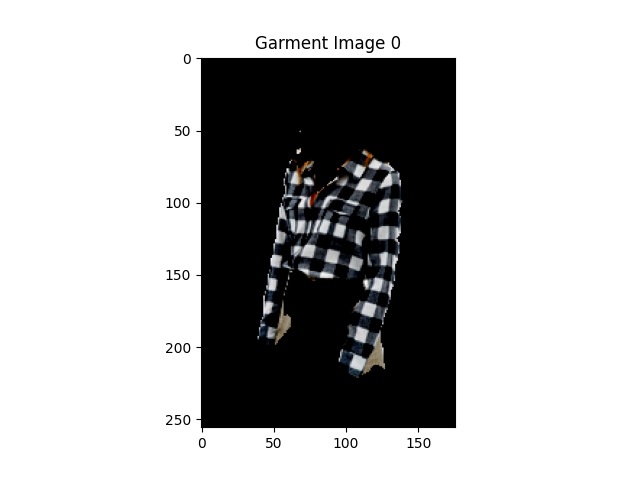

Displaying Garment Image 1:


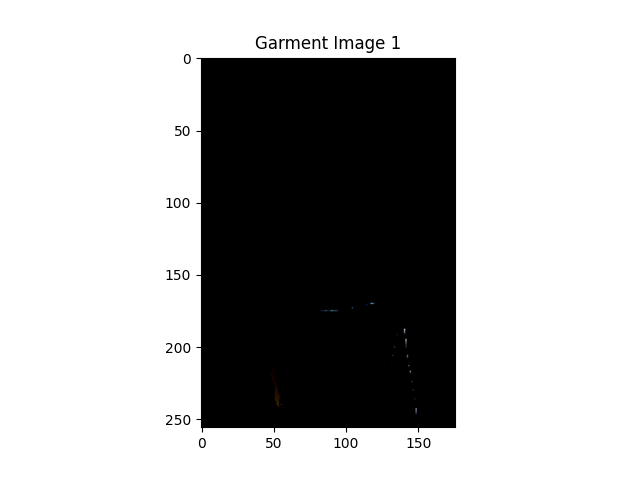

Displaying Generated Image:


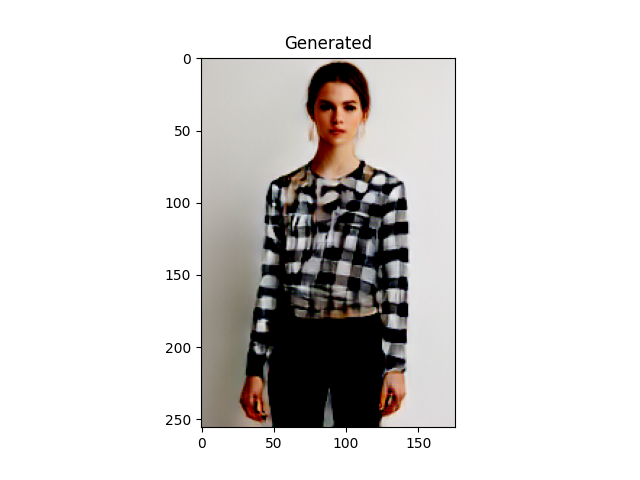

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",3 , None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",2 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 1, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Tuck in (dressing order: hair, top, bottom)
Displaying Person Image:


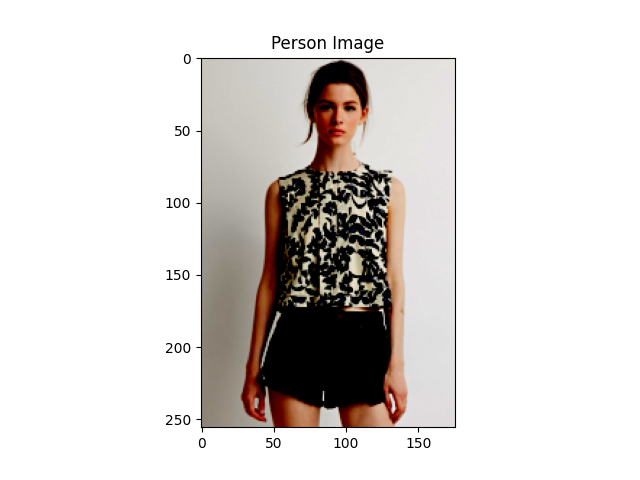

Displaying Garment Image 0:


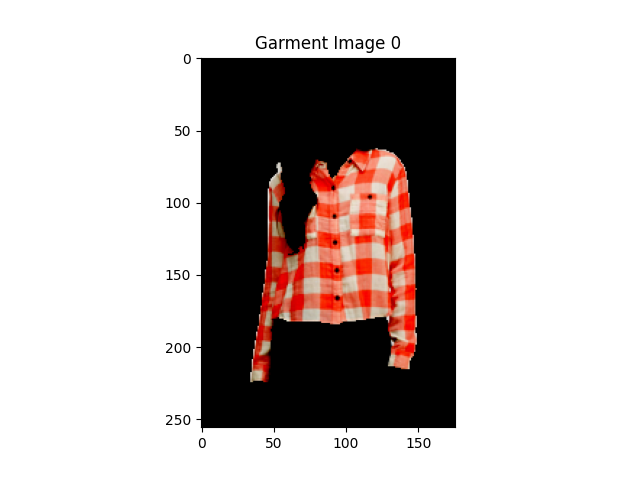

Displaying Garment Image 1:


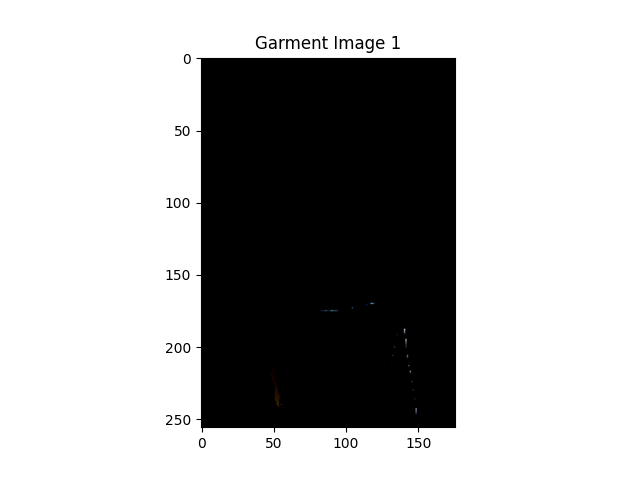

Displaying Generated Image:


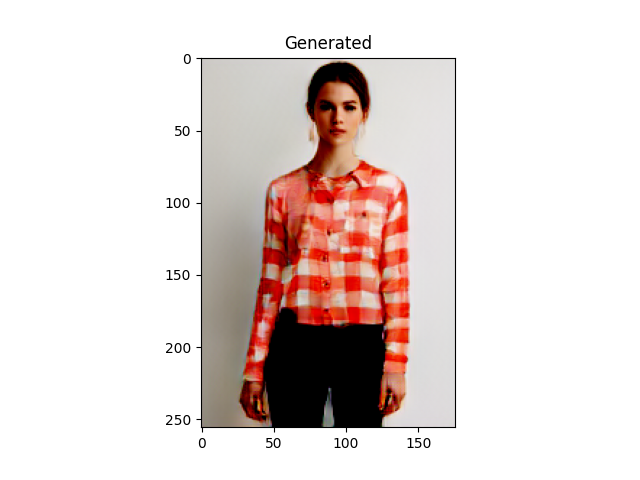

Not tuck in (dressing order: hair, bottom, top)
Displaying Person Image:


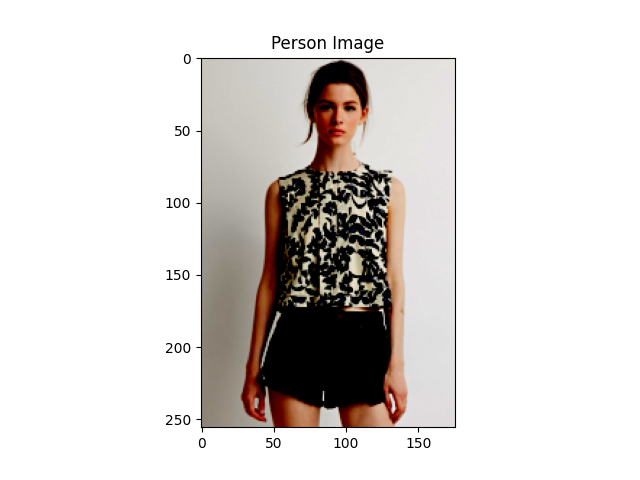

Displaying Garment Image 0:


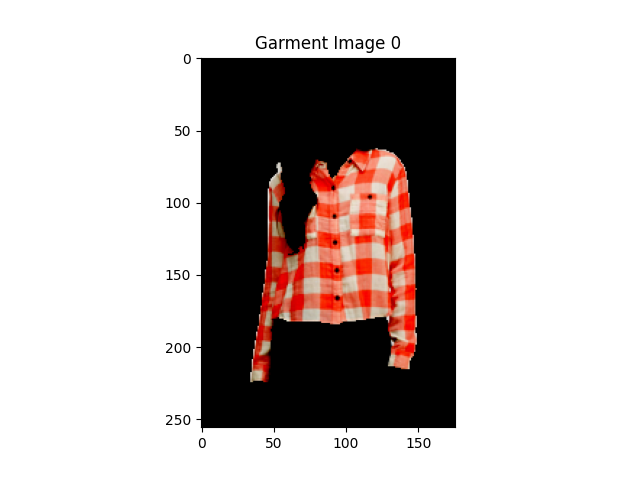

Displaying Garment Image 1:


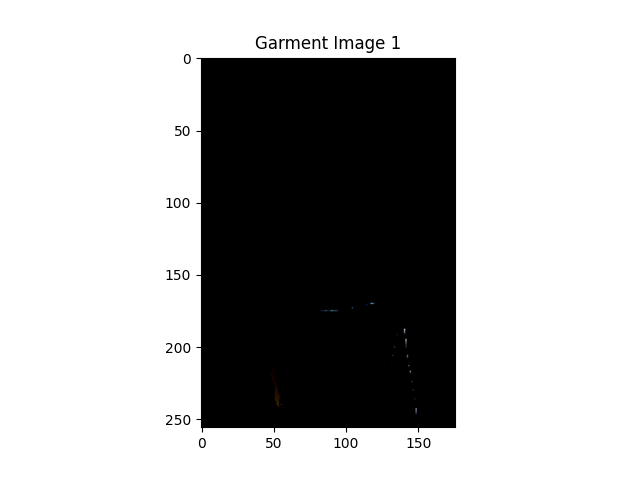

Displaying Generated Image:


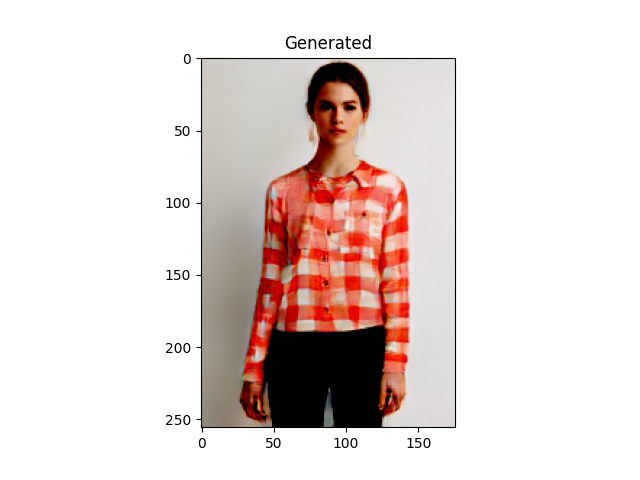

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import os
from PIL import Image
from IPython.display import display

def plot_pose(pose, filename):
    fig, ax = plt.subplots()
    ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
    for i in range(pose.shape[0]):
        x, y = pose[i, :2]  # Assume the first two values are x and y coordinates
        ax.scatter(x, y, c='r')
    plt.title('Pose')
    plt.savefig(filename)
    plt.close(fig)

def plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True):
    # Create temporary files for the images
    temp_dir = tempfile.mkdtemp()
    pimg_filename = os.path.join(temp_dir, 'pimg.png')
    gen_img_filename = os.path.join(temp_dir, 'gen_img.png')
    pose_filename = os.path.join(temp_dir, 'pose.png')
    gimgs_filenames = [os.path.join(temp_dir, f'gimg_{i}.png') for i in range(len(gimgs))]
    
    # Plot and save person image
    plt.figure()
    plt.imshow(pimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Person Image')
    plt.savefig(pimg_filename)
    plt.close()
    
    # Plot and save generated image
    plt.figure()
    plt.imshow(gen_img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))  # Detach, move to CPU, convert to numpy, and clip
    plt.title('Generated')
    plt.savefig(gen_img_filename)
    plt.close()
    
    # Plot and save pose
    plot_pose(pose.detach().cpu().numpy(), pose_filename)  # Detach, move to CPU, and convert to numpy

    # Plot and save garment images with white background
    for i, gimg in enumerate(gimgs):
        fig, ax = plt.subplots()
        ax.imshow(np.ones((256, 176, 3)), cmap='gray')  # White background
        ax.imshow(gimg.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1), alpha=1.0)  # Overlay garment image
        plt.title(f'Garment Image {i}')
        plt.savefig(gimgs_filenames[i])
        plt.close(fig)
    
    if display_images:
        # Load and display the images
        print("Displaying Person Image:")
        display(Image.open(pimg_filename))
       
        for i, filename in enumerate(gimgs_filenames):
            print(f"Displaying Garment Image {i}:")
            display(Image.open(filename))

        print("Displaying Generated Image:")
        display(Image.open(gen_img_filename))



pid = ("pattern",3 , None)  # load the 3rd person from "pattern" group, NONE (no) garment is interested
gids = [
   ("plaid",3 , 5),  # load the 0-th person from "plaid" group, garment #5 (top) is interested
   ("pattern", 1, 1)  # load the 3rd person from "pattern" group, garment #1 (bottom) is interested
]

# tuck in (dressing order: hair, top, bottom)
print("Tuck in (dressing order: hair, top, bottom)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 5, 1])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)

# not tuckin (dressing order: hair, bottom, top)
print("Not tuck in (dressing order: hair, bottom, top)")
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, gids=gids, order=[2, 1, 5])
plot_img(pimg, gimgs, oimgs, gen_img, pose, display_images=True)


Displaying Person Image:


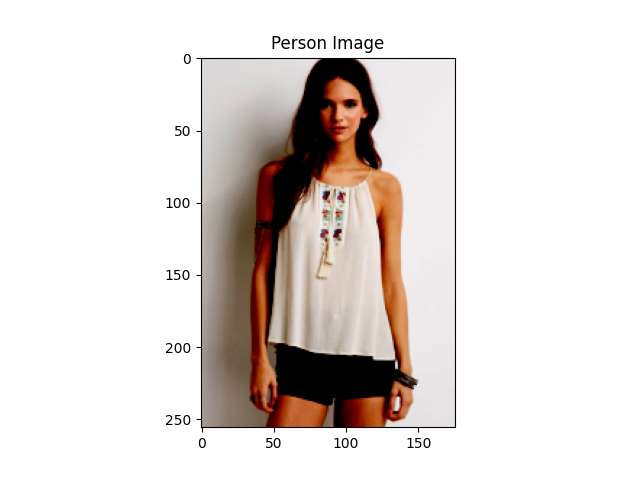

Displaying Garment Image 0:


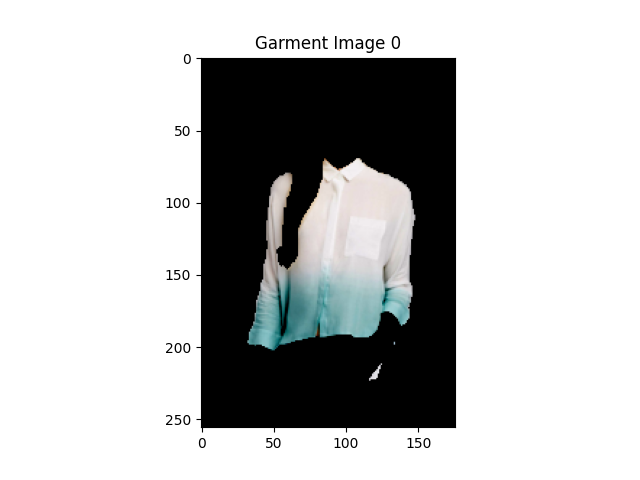

Displaying Garment Image 1:


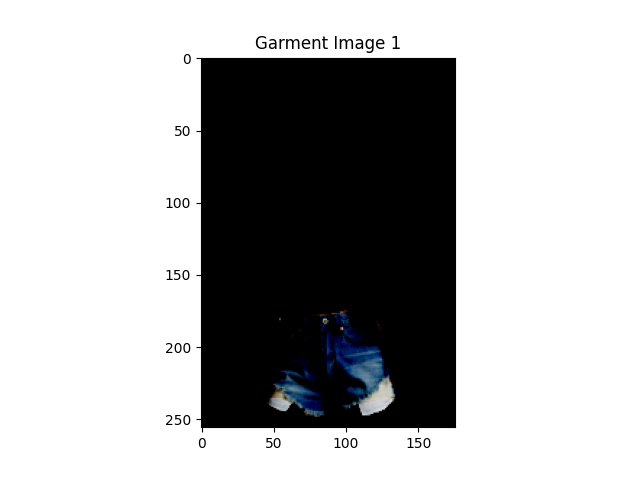

Displaying Generated Image:


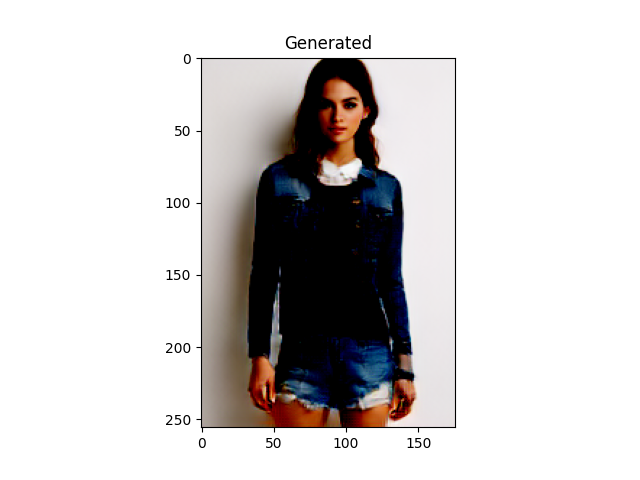

In [83]:
# person id
pid = ("fashionWOMENBlouses_Shirtsid0000637003_1front.jpg", None , None) # load person from the file

# garments to try on (ordered)
gids = [
    ("gfla",2,5),
    ("strip",3,1),
       ]

# garments to lay over (ordered)
ogids = [
 ("fashionWOMENTees_Tanksid0000159006_1front.jpg", None ,5),
 ('fashionWOMENJackets_Coatsid0000645302_1front.jpg', None ,3),    
]

# dressing in order
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid=pid, gids=gids, ogids=ogids)
plot_img(pimg, gimgs, oimgs, gen_img, pose)

Displaying Person Image:


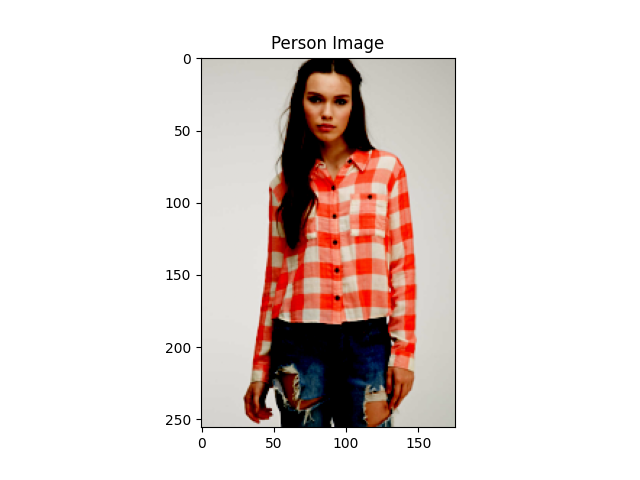

Displaying Generated Image:


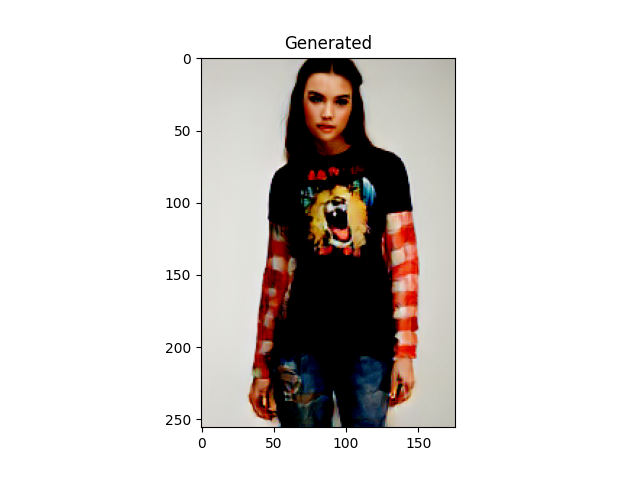

In [84]:
pid = ('plaid',3, 5)
ogids = [('print', 2, 5)]
# tuck in
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid, ogids=ogids)
plot_img(pimg, gimgs, oimgs, gen_img, pose)

Displaying Person Image:


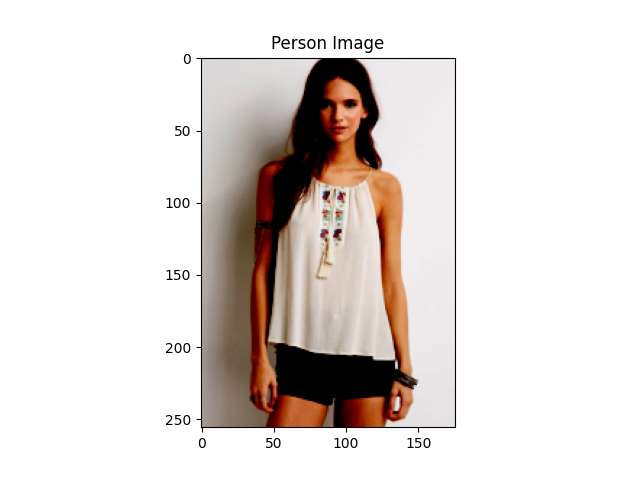

Displaying Garment Image 0:


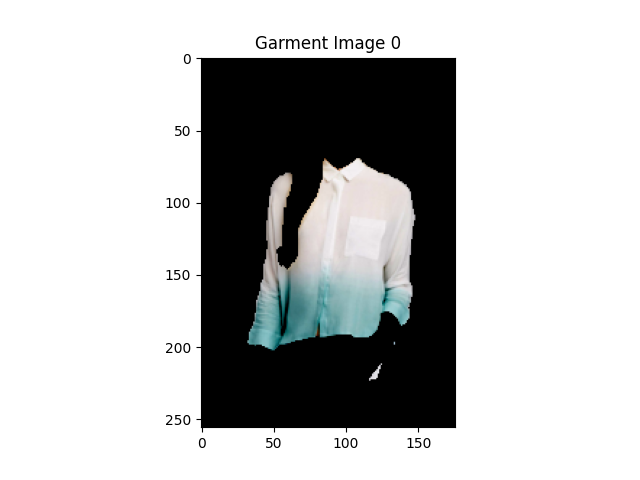

Displaying Garment Image 1:


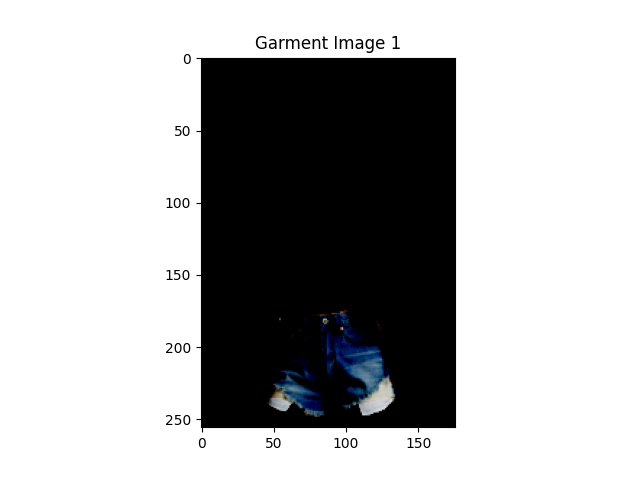

Displaying Generated Image:


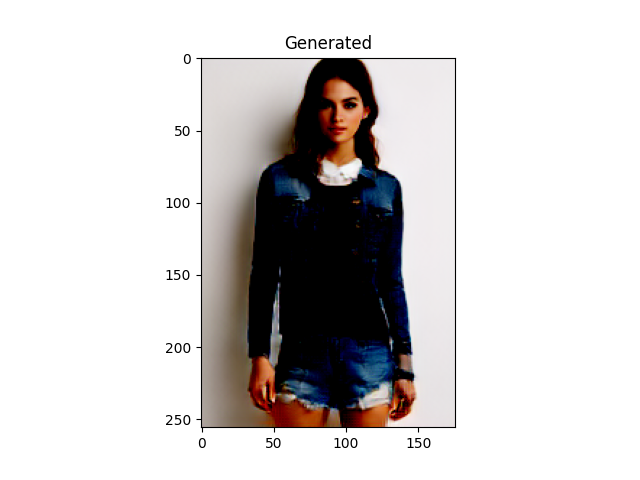

In [85]:
# person id
pid = ("fashionWOMENBlouses_Shirtsid0000637003_1front.jpg", None , None) # load person from the file

# garments to try on (ordered)
gids = [
    ("gfla",2,5),
    ("strip",3,1),
       ]

# garments to lay over (ordered)
ogids = [
 ("fashionWOMENTees_Tanksid0000159006_1front.jpg", None ,5),
 ('fashionWOMENJackets_Coatsid0000645302_1front.jpg', None ,3),    
]

# dressing in order
pimg, gimgs, oimgs, gen_img, pose = dress_in_order(model, pid=pid, gids=gids, ogids=ogids)
plot_img(pimg, gimgs, oimgs, gen_img, pose)

In [86]:

def dress_in_order_texshape(model, pid, target=5, shape_id=None, tex_patch=None, order=[2,5,1,3]):
    PID = [0,4,6,7]
    # encode person
    pimg, parse, from_pose = load_img(pid, ds)
    to_pose = from_pose
    psegs = model.encode_attr(pimg[None], parse[None], from_pose[None], to_pose[None], PID)

    # encode base garments
    gsegs = model.encode_attr(pimg[None], parse[None], from_pose[None], to_pose[None])
    
    fmap, mask = gsegs[target]
    gimg = pimg*(parse==target)
    if shape_id != None:
        gimg, gparse, pose =  load_img(shape_id, ds)
        _, mask = model.encode_single_attr(gimg[None], gparse[None], pose[None], to_pose[None], i=target)
        shape_img = [gimg*(gparse==target)]
    else:
        shape_img = []
    if tex_patch != None:
        fmap = model.netE_attr(tex_patch, model.netVGG)
    gsegs[target] = fmap, mask
    gsegs = [gsegs[i] for i in order]
    gen_img = model.netG(to_pose[None], psegs, gsegs)
    
    return pimg, [gimg], shape_img, gen_img[0], to_pose

Displaying Person Image:


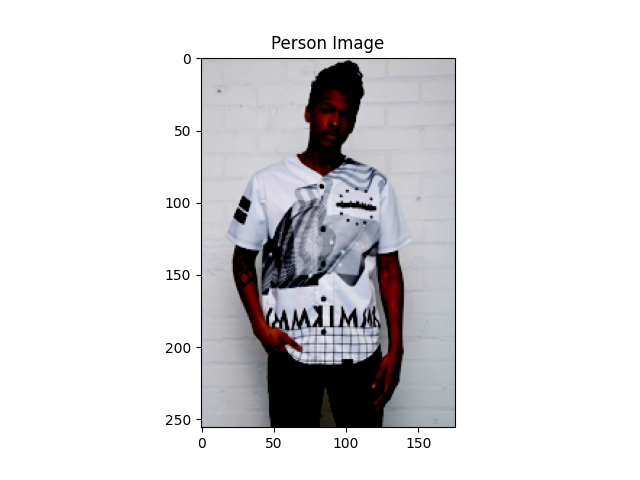

Displaying Garment Image 0:


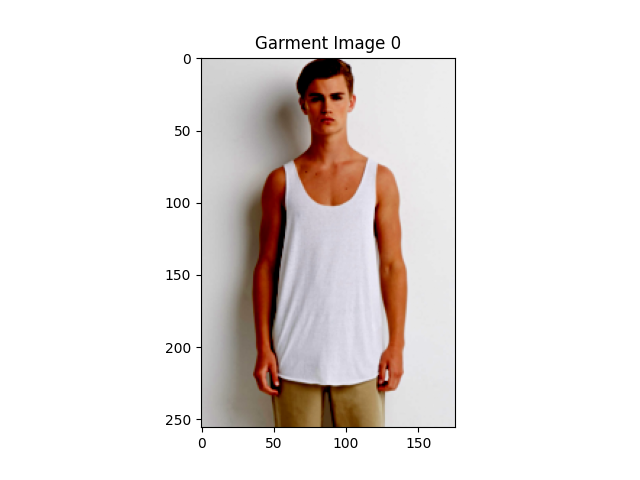

Displaying Generated Image:


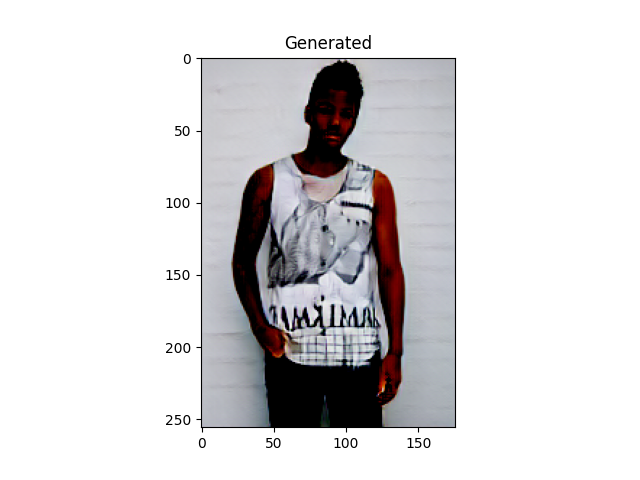

In [87]:
pid = ('print', 0, 5) 
shape_id = ('plain', 2, 5) 

pimg, gimgs, oimgs, gen_img, pose = dress_in_order_texshape(model, pid, shape_id=shape_id)
plot_img(pimg, gimgs, oimgs, gen_img, pose)

Displaying Person Image:


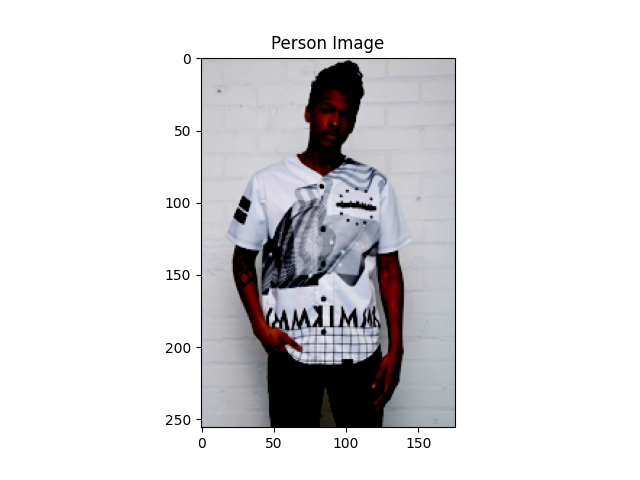

Displaying Garment Image 0:


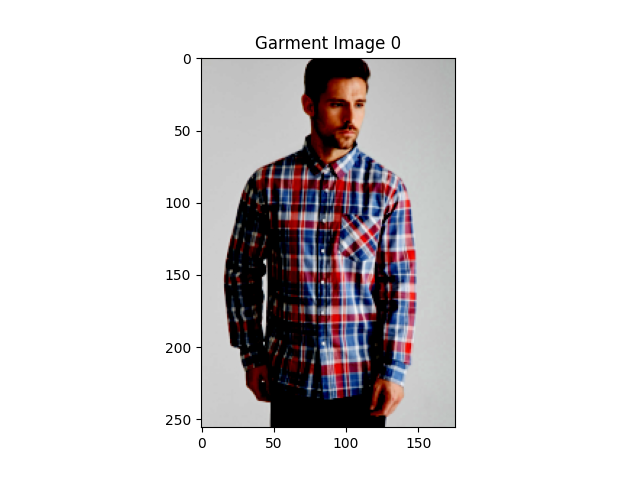

Displaying Generated Image:


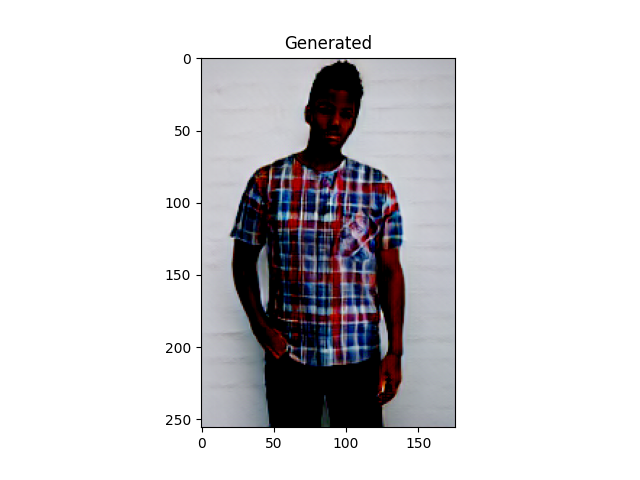

In [88]:

pid = ('print', 0, 5) 
patch_id = ('plaid', 0, 5) 
patch, parse, from_pose = load_img(patch_id, ds)
pimg, gimgs, oimgs, gen_img, pose = dress_in_order_texshape(model, pid, tex_patch=patch[None])
plot_img(pimg, [patch], oimgs, gen_img, pose)
     